In [1]:
from google.colab import drive
drive.mount('/content/gdrive')
!ln -s /content/gdrive/My\ Drive/ /mydrive
%cd /mydrive/yolov9-main

Mounted at /content/gdrive
/content/gdrive/My Drive/yolov9-main


In [ ]:
import cv2
import numpy as np
instance_path = "datasets/PhenoBench/train/plant_instances/05-26_00193_P0034119.png"
semantic_path = "datasets/PhenoBench/train/semantics/05-26_00193_P0034119.png"

instance_mask = cv2.imread(instance_path, cv2.IMREAD_UNCHANGED)
semantic_mask = cv2.imread(semantic_path, cv2.IMREAD_UNCHANGED)

print("Instance mask shape:", instance_mask.shape, "Unique vals:", np.unique(instance_mask))
print("Semantic mask shape:", semantic_mask.shape, "Unique vals:", np.unique(semantic_mask))

if semantic_mask.ndim == 3:
    print("Semantic mask channels:", semantic_mask.shape[2])
    semantic_mask_gray = semantic_mask[:, :, 0]
    print("Unique vals in semantic_mask_gray:", np.unique(semantic_mask_gray))

Instance mask shape: (1024, 1024) Unique vals: [   0  229  235  236  237  238  315  335  336  337  338  342  517 1263
 1265]
Semantic mask shape: (1024, 1024) Unique vals: [0 1 2 3]


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels | wc -l

1407
1407


In [ ]:
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val | wc -l
!ls /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels | wc -l

772
772


In [ ]:
import os
import json
import cv2
import numpy as np
from glob import glob
from tqdm import tqdm

# === User config ===
output_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations"
os.makedirs(output_dir, exist_ok=True)

# Base image and label directories
image_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
}
label_dirs = {
    "train": "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/train/labels",
    "val":   "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/valid/labels"
}

class_names = ["crop", "weed"]

def convert_to_coco(split):
    image_dir = image_dirs[split]
    label_dir = label_dirs[split]

    image_paths = sorted(glob(os.path.join(image_dir, "*.png")) + glob(os.path.join(image_dir, "*.jpg")))
    images = []
    annotations = []
    ann_id = 0

    for img_id, img_path in enumerate(tqdm(image_paths, desc=f"[{split}] Processing images")):
        filename = os.path.basename(img_path)
        name = os.path.splitext(filename)[0]
        label_path = os.path.join(label_dir, f"{name}.txt")

        img = cv2.imread(img_path)
        if img is None:
            print(f"⚠️ Image load failed: {img_path}")
            continue
        height, width = img.shape[:2]

        images.append({
            "id": img_id,
            "file_name": filename,
            "width": width,
            "height": height
        })

        if not os.path.exists(label_path):
            continue

        with open(label_path, "r") as f:
            lines = f.readlines()

        for line in lines:
            parts = line.strip().split()
            if len(parts) < 7:
                continue

            try:
                cls_id = int(parts[0])
                coords = list(map(float, parts[1:]))

                if len(coords) % 2 != 0:
                    continue

                coords_np = np.array(coords).reshape(-1, 2)
                coords_np = np.clip(coords_np, 0, 1)
                abs_coords = (coords_np * np.array([width, height])).astype(np.float32)
                abs_coords_flat = abs_coords.flatten().tolist()

                if len(abs_coords) < 3:
                    continue

                x_min, y_min = abs_coords.min(axis=0)
                x_max, y_max = abs_coords.max(axis=0)
                bbox = [float(x_min), float(y_min), float(x_max - x_min), float(y_max - y_min)]
                area = float((x_max - x_min) * (y_max - y_min))

                annotations.append({
                    "id": ann_id,
                    "image_id": img_id,
                    "category_id": cls_id,
                    "segmentation": [abs_coords_flat],
                    "area": area,
                    "bbox": bbox,
                    "iscrowd": 0
                })
                ann_id += 1
            except Exception as e:
                print(f"❌ Error in {label_path}: {e}")
                continue

    coco_dict = {
        "info": {
            "description": f"PhenoBench {split} in COCO instance format"
        },
        "licenses": [],
        "images": images,
        "annotations": annotations,
        "categories": [
            {"id": i, "name": name, "supercategory": "plant"} for i, name in enumerate(class_names)
        ]
    }

    out_json = os.path.join(output_dir, f"instances_{split}.json")
    with open(out_json, "w") as f:
        json.dump(coco_dict, f)
    print(f"✅ Saved: {out_json} — {len(images)} images, {len(annotations)} instances")

# Run for both splits
convert_to_coco("train")
convert_to_coco("val")

[train] Processing images: 100%|██████████| 1407/1407 [21:03<00:00,  1.11it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json — 1407 images, 23253 instances


[val] Processing images: 100%|██████████| 772/772 [11:15<00:00,  1.14it/s]


✅ Saved: /content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json — 772 images, 11874 instances


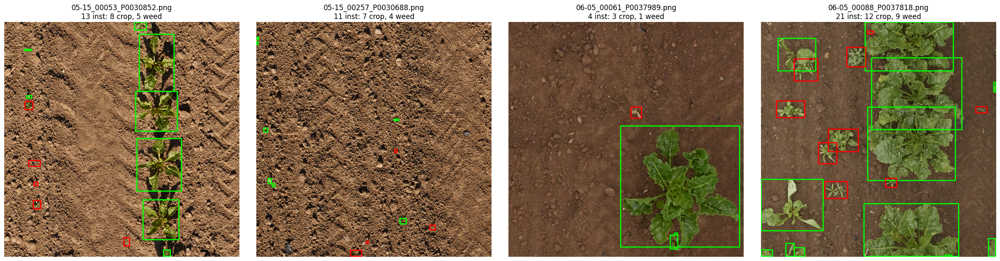

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/train"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_train.json"

# --- Fixed Colors ---
CROP_COLOR = (0, 255, 0)   # Green
WEED_COLOR = (255, 0, 0)   # Red

def get_color(cls_id):
    return CROP_COLOR if cls_id == 0 else WEED_COLOR

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick 4 random images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        x, y, w, h = ann["bbox"]
        x1, y1, x2, y2 = int(x), int(y), int(x + w), int(y + h)

        color = get_color(cls_id)
        cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 3)

    axes[i].imshow(overlay)
    axes[i].set_title(f"{filename}\n{len(anns)} inst: {count_crop} crop, {count_weed} weed")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

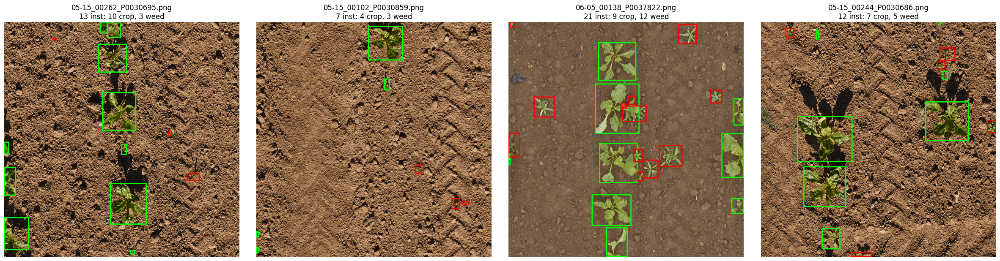

In [ ]:
import os
import json
import random
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json"

# --- Fixed Colors ---
CROP_COLOR = (0, 255, 0)   # Green
WEED_COLOR = (255, 0, 0)   # Red

def get_color(cls_id):
    return CROP_COLOR if cls_id == 0 else WEED_COLOR

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Pick 4 random images ---
random_img_ids = random.sample(list(image_id_map.keys()), 4)

fig, axes = plt.subplots(1, 4, figsize=(24, 6))

for i, img_id in enumerate(random_img_ids):
    filename = image_id_map[img_id]
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load: {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    overlay = img.copy()

    anns = annotations_per_image.get(img_id, [])
    count_crop = 0
    count_weed = 0

    for ann in anns:
        cls_id = ann["category_id"]
        if cls_id == 0:
            count_crop += 1
        elif cls_id == 1:
            count_weed += 1

        x, y, w, h = ann["bbox"]
        x1, y1, x2, y2 = int(x), int(y), int(x + w), int(y + h)

        color = get_color(cls_id)
        cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 3)

    axes[i].imshow(overlay)
    axes[i].set_title(f"{filename}\n{len(anns)} inst: {count_crop} crop, {count_weed} weed")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
# STEP 1: Install compatible PyTorch (2.0.1 + CUDA 11.7)
!pip install torch==2.0.1 torchvision torchaudio --index-url https://download.pytorch.org/whl/cu117

# STEP 2: Install OpenMMLab tools
!pip install -U openmim
!mim install "mmengine>=0.7.4"
!mim install "mmcv==2.1.0"

# STEP 3: Clone MMDetection & install
!git clone https://github.com/open-mmlab/mmdetection.git
%cd mmdetection
!pip install -e .

In [ ]:
# STEP 4: Final check
!python -c "import torch; import mmcv; import mmdet; print('PyTorch:', torch.__version__); print('MMCV:', mmcv.__version__); print('MMDet:', mmdet.__version__)"

PyTorch: 2.0.1+cu117
MMCV: 2.1.0
MMDet: 3.3.0


In [ ]:
!pip install numpy==1.24.4

In [2]:
!ls mmdetection/projects/EfficientDet/configs/

efficientdet_effb0_bifpn_8xb16-crop512-300e_coco.py
efficientdet_effb3_bifpn_8xb16-crop896-300e_coco-90cls.py
efficientdet_effb3_bifpn_8xb16-crop896-300e_coco.py
efficientdet_pheno.py
tensorflow


In [ ]:
custom_cfg = """
_base_ = 'efficientdet_effb3_bifpn_8xb16-crop896-300e_coco.py'

visualizer = dict(
    type='Visualizer',
    vis_backends=[
        dict(type='LocalVisBackend'),  # no Tensorboard backend
        # ✅ DO NOT include 'TensorboardVisBackend'
    ],
    name='visualizer'
)

# Custom classes
dataset_type = 'CocoDataset'
metainfo = dict(classes=('crop', 'weed'))
num_classes = 2

# Paths
data_root = '/content/gdrive/MyDrive/yolov9-main/datasets/'
train_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_train.json'
val_ann = data_root + 'PhenoBenchYOLOv9/annotations/instances_val.json'
train_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/train/'
val_img = data_root + 'PhenoBench_COCO_Panoptic_Plant/val/'

# Data loaders
train_dataloader = dict(
    batch_size=8,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        metainfo=metainfo,
        data_root=data_root,
        ann_file=train_ann,
        data_prefix=dict(img=train_img)
    )
)
val_dataloader = dict(
    batch_size=8,
    num_workers=8,
    dataset=dict(
        type=dataset_type,
        metainfo=metainfo,
        data_root=data_root,
        ann_file=val_ann,
        data_prefix=dict(img=val_img)
    )
)
test_dataloader = val_dataloader

# Model
#model = dict(bbox_head=dict(num_classes=num_classes))
model = dict(bbox_head=dict(num_classes=num_classes), test_cfg=dict(score_thr=0.3))

# Evaluation: use mAP for detection
val_evaluator = dict(type='CocoMetric', ann_file=val_ann, metric=['bbox'], classwise=True)
test_evaluator = val_evaluator

# === Training
train_cfg = dict(type='EpochBasedTrainLoop', max_epochs=20, val_interval=1)

val_cfg = dict(type='ValLoop')
test_cfg = dict(type='TestLoop')

# Optimizer
optim_wrapper = dict(
    optimizer=dict(type='SGD', lr=0.001, momentum=0.9, weight_decay=0.0001),
)
optimizer_config = dict(grad_clip=dict(max_norm=35, norm_type=2))

# === Scheduler
param_scheduler = [
    dict(type='LinearLR', start_factor=0.001, by_epoch=False, begin=0, end=880),
    dict(type='MultiStepLR', begin=0, end=20, by_epoch=True, milestones=[15, 18], gamma=0.1)
]

# Logging and checkpointing
default_hooks = dict(
    logger=dict(type='LoggerHook', interval=2),
    checkpoint=dict(
        type='CheckpointHook',
        interval=2,
        save_best='coco/bbox_mAP',
        rule='greater'
    ),
)

# Output path
work_dir = '/content/gdrive/MyDrive/yolov9-main/mmdetection/mmdet_outputs/efficientdet_crop_weed'

# Load pretrained COCO model
load_from = 'https://download.openmmlab.com/mmdetection/v3.0/efficientdet/efficientdet_effb3_bifpn_8xb16-crop896-300e_coco/efficientdet_effb3_bifpn_8xb16-crop896-300e_coco_20230223_122457-e6f7a833.pth'
"""

with open('mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py', 'w') as f:
    f.write(custom_cfg)

In [ ]:
!python mmdetection/tools/train.py \
  mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py --amp

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 15:23:59 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 242282905
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [ ]:
!python mmdetection/tools/test.py mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 17:11:03 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 1264808871
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA

In [ ]:
!python mmdetection/tools/test.py \
  mmdetection/projects/EfficientDet/configs/efficientdet_pheno.py \
  mmdetection/mmdet_outputs/efficientdet_crop_weed/best_coco_bbox_mAP_epoch_18.pth \
  --out result.pkl

Disabling PyTorch because PyTorch >= 2.1 is required but found 2.0.1+cu117
07/19 18:19:16 - mmengine - INFO - 
------------------------------------------------------------
System environment:
    sys.platform: linux
    Python: 3.11.13 (main, Jun  4 2025, 08:57:29) [GCC 11.4.0]
    CUDA available: True
    MUSA available: False
    numpy_random_seed: 304716766
    GPU 0: NVIDIA L4
    CUDA_HOME: /usr/local/cuda
    NVCC: Cuda compilation tools, release 12.5, V12.5.82
    GCC: x86_64-linux-gnu-gcc (Ubuntu 11.4.0-1ubuntu1~22.04) 11.4.0
    PyTorch: 2.0.1+cu117
    PyTorch compiling details: PyTorch built with:
  - GCC 9.3
  - C++ Version: 201703
  - Intel(R) oneAPI Math Kernel Library Version 2022.2-Product Build 20220804 for Intel(R) 64 architecture applications
  - Intel(R) MKL-DNN v2.7.3 (Git Hash 6dbeffbae1f23cbbeae17adb7b5b13f1f37c080e)
  - OpenMP 201511 (a.k.a. OpenMP 4.5)
  - LAPACK is enabled (usually provided by MKL)
  - NNPACK is enabled
  - CPU capability usage: AVX2
  - CUDA 

In [3]:
import pickle

with open('result.pkl', 'rb') as f:
    results = pickle.load(f)
#print(results[0])

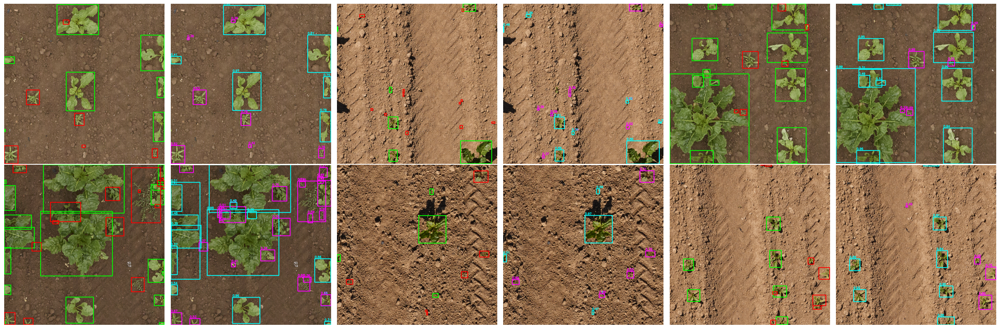

In [4]:
import os
import json
import random
import pickle
import cv2
import numpy as np
import matplotlib.pyplot as plt

# --- Paths ---
image_dir = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBench_COCO_Panoptic_Plant/val"
json_path = "/content/gdrive/MyDrive/yolov9-main/datasets/PhenoBenchYOLOv9/annotations/instances_val.json"
result_pkl_path = "result.pkl"  # path to your saved result.pkl file

# --- Fixed Colors ---
GT_COLORS = {0: (0, 255, 0),   # Green (Crop)
             1: (255, 0, 0)}   # Red (Weed)

PRED_COLORS = {0: (0, 255, 255),  # Cyan (Crop)
               1: (255, 0, 255)}  # Magenta (Weed)

# --- Load COCO JSON ---
with open(json_path, "r") as f:
    coco = json.load(f)

image_id_map = {img['id']: img['file_name'] for img in coco['images']}
annotations_per_image = {}
for ann in coco['annotations']:
    img_id = ann['image_id']
    annotations_per_image.setdefault(img_id, []).append(ann)

# --- Load pred results ---
with open(result_pkl_path, 'rb') as f:
    pred_results = pickle.load(f)

# Build map from image filename to pred result
pred_map = {os.path.basename(res['img_path']): res for res in pred_results}

# --- Choose N random images from pred_map keys ---
N = 6
random_filenames = random.sample(list(pred_map.keys()), N)

# Calculate subplot layout (2 cols per image: GT + Pred)
cols = 6
rows = (N * 2 + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 4))
axes = axes.flatten()

def draw_bboxes(img, bboxes, labels, scores=None, title=None, is_gt=True):
    overlay = img.copy()
    for i, (bbox, label) in enumerate(zip(bboxes, labels)):
        color = GT_COLORS[label] if is_gt else PRED_COLORS[label]
        x1, y1, x2, y2 = map(int, bbox)
        cv2.rectangle(overlay, (x1, y1), (x2, y2), color, 3)
        if scores is not None and not is_gt:
            score_text = f"{scores[i]:.2f}"
            cv2.putText(overlay, score_text, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
    return overlay

for idx, filename in enumerate(random_filenames):
    img_path = os.path.join(image_dir, filename)
    img = cv2.imread(img_path)
    if img is None:
        print(f"⚠️ Failed to load image {img_path}")
        continue
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Find GT annotations
    img_id = next(k for k, v in image_id_map.items() if v == filename)
    gt_anns = annotations_per_image.get(img_id, [])
    gt_bboxes = [[x, y, x+w, y+h] for ann in gt_anns for x, y, w, h in [ann['bbox']]]
    gt_labels = [ann['category_id'] for ann in gt_anns]

    # Draw GT
    gt_img = draw_bboxes(img, gt_bboxes, gt_labels, title=f"GT: {filename}", is_gt=True)

    # Draw Predictions
    pred = pred_map[filename]
    pred_bboxes = pred['pred_instances']['bboxes'].numpy()
    pred_labels = pred['pred_instances']['labels'].numpy()
    pred_scores = pred['pred_instances']['scores'].numpy()

    # Filter low confidence predictions
    thresh = 0.3
    keep = pred_scores >= thresh
    pred_bboxes = pred_bboxes[keep]
    pred_labels = pred_labels[keep]
    pred_scores = pred_scores[keep]

    pred_img = draw_bboxes(img, pred_bboxes, pred_labels, pred_scores, title=f"Pred: {filename}", is_gt=False)

    # Plot GT and Pred
    axes[idx * 2].imshow(gt_img)
    axes[idx * 2].axis('off')
    axes[idx * 2 + 1].imshow(pred_img)
    axes[idx * 2 + 1].axis('off')

# Hide unused axes
for j in range(len(random_filenames) * 2, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()